In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.graph_objects as go
import sys
sys.path.insert(0,'../build/src/')
import libimp
import xarray as xr

In [24]:
data_path = "../Data/ERA5_land/preci/"
ds = xr.open_dataset(data_path+"Bordeaux_tp_daily_sum_1950_2023.nc")
ts_sst = ds.tp.values
date_sst = ds.time.values
window_size = 14
interval_length = 61
exclude = 7
start_year = np.datetime64(date_sst[0], 'Y').astype(int) + 1970
end_year = np.datetime64(date_sst[-1], 'Y').astype(int) + 1970
period_starts = []
for year in range(start_year, end_year+1):
    period_starts.append(np.where(date_sst == np.datetime64(str(year) + "-01-01"))[0][0])
block_width = 500
block_height = 500

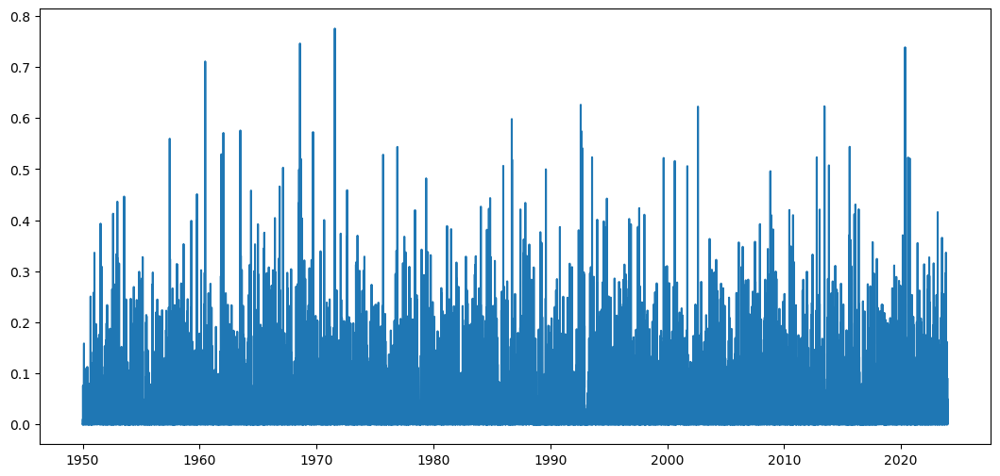

In [21]:
plt.figure(figsize=(13,6))
plt.plot(date_sst, ts_sst)
plt.show()

In [25]:
mp_sst, mp_index_sst = libimp.STOMP_double(ts_sst, window_size, exclude, block_width, block_width)
imp_sst, imp_index_sst = libimp.imp_STOMP_double(ts_sst, window_size, period_starts, interval_length, exclude)

imp_3NN, imp_3NN_index = libimp.imp_STOMP_knn_double(ts_sst, window_size, period_starts, interval_length, exclude, 3)
imp_5NN, imp_5NN_index = libimp.imp_STOMP_knn_double(ts_sst, window_size, period_starts, interval_length, exclude, 5)
imp_10NN, imp_10NN_index = libimp.imp_STOMP_knn_double(ts_sst, window_size, period_starts, interval_length, exclude, 10)

size = len(mp_sst)

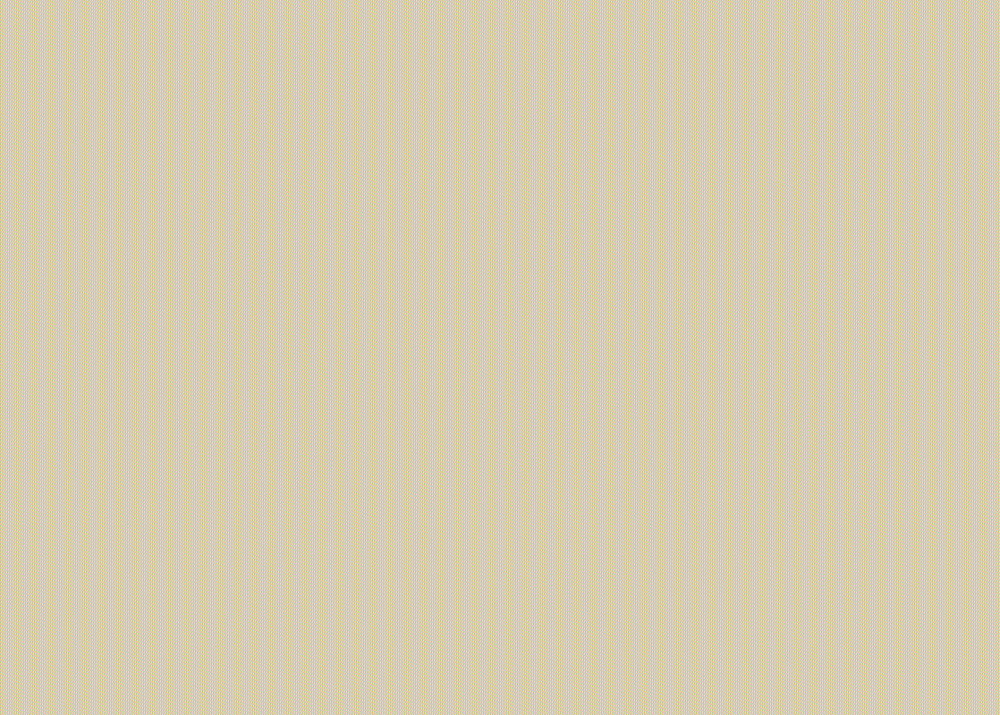

In [26]:
mp_date = date_sst[:size]
ind_discord_mp = np.argpartition(mp_sst, -30)[-30:]
ind_discord_imp = np.argpartition(imp_sst, -30)[-30:]

cut_off_mp = np.min(mp_sst[ind_discord_mp])
cut_off_imp = np.min(imp_sst[ind_discord_imp])

hover_text_mp = [f"NN: {date_sst[ind]}" for ind in mp_index_sst]
hover_text_imp = [f"NN: {date_sst[ind]}" for ind in imp_index_sst]
fig = go.Figure()
# Add traces
fig.add_trace(go.Scatter(x=mp_date, y=imp_sst, mode='lines', name='IMP', text=hover_text_imp))
fig.add_trace(go.Scatter(x=mp_date, y=mp_sst, mode='lines', name='MP', text=hover_text_mp))
fig.add_trace(go.Scatter(x=mp_date, y=np.zeros(mp_date.shape[0]) + cut_off_mp, mode='lines', line=dict(dash='dash',color='red'), name='MP cutoff', hoverinfo='skip'))
fig.add_trace(go.Scatter(x=mp_date, y=np.zeros(mp_date.shape[0]) + cut_off_imp, mode='lines', line=dict(dash='dash',color='blue'), name='IMP cutoff', hoverinfo='skip'))
# Update layout
fig.update_layout(
    title="Sample Plot",
    xaxis_title="Date",
    yaxis_title="Distance",
    legend_title="Method",
    autosize=True,
    #width=1300,
    height=800,
    hovermode='x unified',
)
# Show the figure
fig.show()